In [1]:
import numpy as np
import pandas as pd
import geopandas as gp
import pysal as ps
import matplotlib
import matplotlib.pyplot as plt
%pylab inline
from gwr.sel_bw import Sel_BW
from gwr.gwr import GWR
from pysal.contrib.glm.family import Gaussian

Populating the interactive namespace from numpy and matplotlib


In [2]:
# prep data
data = ps.open('E://osu/research/County_all.csv')
coords = list(zip(data.by_col('x'), data.by_col('y')))
POP16 = np.array(data.by_col('POP16')).reshape((-1,1))
y = np.array(data.by_col('Tweets')).reshape((-1,1))
y = y/POP16
y = (y - np.mean(y)) / np.std(y)

UEP16 = np.array(data.by_col('UEP16')).reshape((-1,1))
UEP16 = (UEP16 - np.mean(UEP16)) / np.std(UEP16)
MHI15 = np.array(data.by_col('MHI15')).reshape((-1,1))
MHI15 = (MHI15 - np.mean(MHI15)) / np.std(MHI15)
PCTPOV15 = np.array(data.by_col('PCTPOV15')).reshape((-1,1))
PCTPOV15 = (PCTPOV15 - np.mean(PCTPOV15)) / np.std(PCTPOV15)
PCTHSD15 = np.array(data.by_col('PCTHSD15')).reshape((-1,1))
PCTHSD15 = (PCTHSD15 - np.mean(PCTHSD15)) / np.std(PCTHSD15)
PCTBD15 = np.array(data.by_col('PCTBD15')).reshape((-1,1))
PCTBD15 = (PCTBD15 - np.mean(PCTBD15)) / np.std(PCTBD15)
PCT15_24 = np.array(data.by_col('PCT15_24')).reshape((-1,1))
PCT15_24 = (PCT15_24 - np.mean(PCT15_24)) / np.std(PCT15_24)
PCT25_34 = np.array(data.by_col('PCT25_34')).reshape((-1,1))
PCT25_34 = (PCT25_34 - np.mean(PCT25_34)) / np.std(PCT25_34)
PCT35_44 = np.array(data.by_col('PCT35_44')).reshape((-1,1))
PCT35_44 = (PCT35_44 - np.mean(PCT35_44)) / np.std(PCT35_44)
PCTMALE = np.array(data.by_col('PCTMALE')).reshape((-1,1))
PCTMALE = (PCTMALE - np.mean(PCTMALE)) / np.std(PCTMALE)
PCTFEMALE = np.array(data.by_col('PCTFEMALE')).reshape((-1,1))
PCTFEMALE = (PCTFEMALE - np.mean(PCTFEMALE)) / np.std(PCTFEMALE)
PCTWM = np.array(data.by_col('PCTWM')).reshape((-1,1))
PCTWM = (PCTWM  - np.mean(PCTWM)) / np.std(PCTWM)
PCTWF = np.array(data.by_col('PCTWF')).reshape((-1,1))
PCTWF = (PCTWF  - np.mean(PCTWF)) / np.std(PCTWF)
PCTBM = np.array(data.by_col('PCTBM')).reshape((-1,1))
PCTBM = (PCTBM - np.mean(PCTBM)) / np.std(PCTBM)
PCTBF = np.array(data.by_col('PCTBF')).reshape((-1,1))
PCTBF = (PCTBF - np.mean(PCTBF)) / np.std(PCTBF)
PCTHM = np.array(data.by_col('PCTHM')).reshape((-1,1))
PCTHM = (PCTHM - np.mean(PCTHM)) / np.std(PCTHM)
PCTHF = np.array(data.by_col('PCTHF')).reshape((-1,1))
PCTHF = (PCTHF - np.mean(PCTHF)) / np.std(PCTHF)

X = np.hstack([ PCTPOV15,PCTBD15, PCT15_24,PCT25_34,PCT35_44, PCTWM])
labels = ['Intercept','Poverty','Bachelor degree',
          'age:15-24','age:25-34','age:35-44','White Male']

In [3]:
X

array([[ 0.78901791, -0.95234436, -0.25407275, -0.09145134,  0.63311842,
         0.64397182],
       [-1.03784379, -0.27597633, -0.21130425, -0.70798952, -0.79680075,
         0.84834169],
       [-0.41856863,  1.18763972,  2.23993436,  0.89989053, -0.34836758,
         0.33601656],
       ..., 
       [-0.2947136 ,  1.39831172,  1.75915878, -0.14637212, -0.55901369,
         0.25492429],
       [ 0.49486222, -0.51991234, -0.74849805, -0.40933212, -0.85505697,
         0.39505653],
       [-1.73452833,  0.7662957 , -0.1626174 ,  0.00925237,  1.89162354,
         0.68527447]])

In [4]:
xdf =  pd.DataFrame(X,columns =['Poverty','Bachelor degree',
          'age:15-24','age:25-34','age:35-44','White Male'])

In [5]:
xdf.head()

,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
0,0.789018,-0.952344,-0.254073,-0.091451,0.633118,0.643972
1,-1.037844,-0.275976,-0.211304,-0.707990,-0.796801,0.848342
2,-0.418569,1.187640,2.239934,0.899891,-0.348368,0.336017
3,-1.285554,2.263176,-0.028438,-1.148125,0.318435,0.468564
4,0.773536,-0.508824,-0.038982,0.787763,0.103141,-1.068069


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000000AA7B3C8>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000000C78FB00>]], dtype=object)

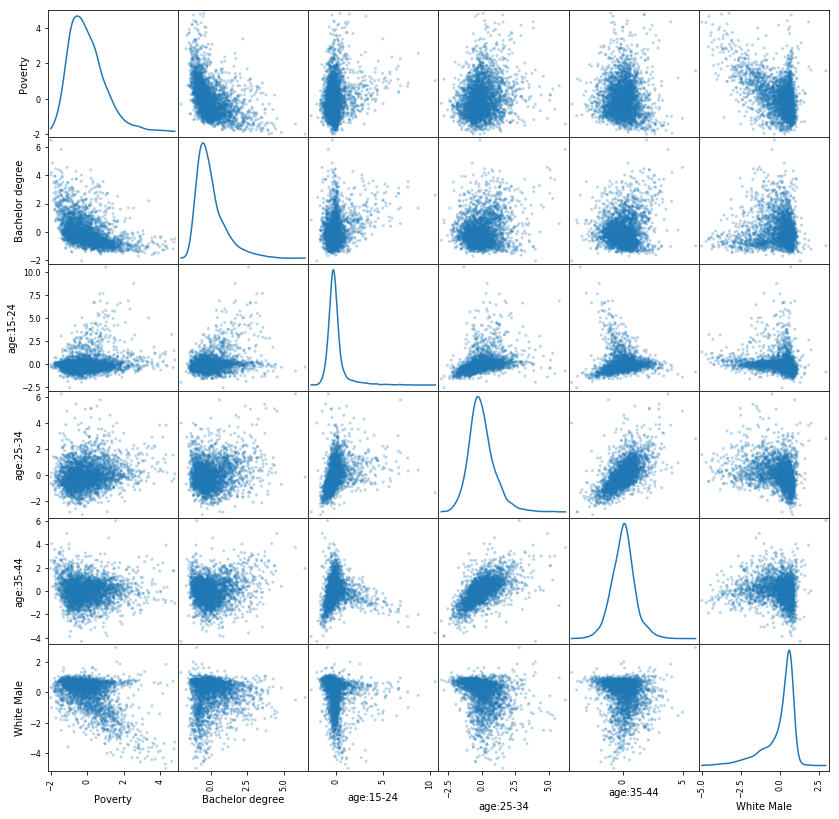

In [6]:
pd.plotting.scatter_matrix(xdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

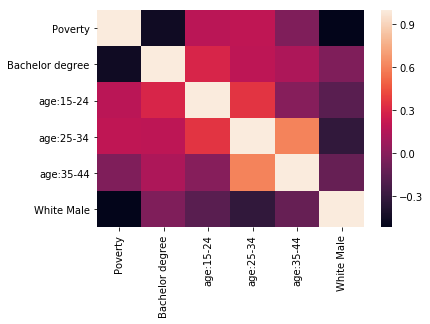

In [7]:
import seaborn as sns
corr = xdf.corr()
sns.heatmap(corr,xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [8]:
corr

,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
Poverty,1.000000,-0.457160,0.179602,0.194932,-0.025823,-0.516502
Bachelor degree,-0.457160,1.000000,0.296078,0.190071,0.132033,-0.024864
age:15-24,0.179602,0.296078,1.000000,0.356110,-0.001216,-0.163436
age:25-34,0.194932,0.190071,0.356110,1.000000,0.603154,-0.318726
age:35-44,-0.025823,0.132033,-0.001216,0.603154,1.000000,-0.116762
White Male,-0.516502,-0.024864,-0.163436,-0.318726,-0.116762,1.000000


In [9]:
# multiple regresssion and vif
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

#df = pd.read_csv('E://osu/research/County_all.csv')
df =  pd.DataFrame(X,columns =[ 'Poverty','Bachelor_degree',
          'age_15_24','age_25_34','age_35_44','White_Male'])
df["Tweets"]= pd.DataFrame(y)
df.shape
df.columns

d:\program files\python\python36\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Index(['Poverty', 'Bachelor_degree', 'age_15_24', 'age_25_34', 'age_35_44',
       'White_Male', 'Tweets'],
      dtype='object')

In [10]:
# Break into left and right hand side; y and X

y1, X1 = dmatrices('Tweets ~'+df.columns[0]+ '+' +df.columns[1] +'+'+df.columns[2]+'+'+df.columns[3]+'+'+df.columns[4]+'+'+df.columns[5] , data=df, return_type="dataframe")

# For each Xi, calculate VIF
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]
vif["features"] = X1.columns
# Fit X to y
result = sm.OLS(y1, X1).fit()

In [11]:
vif.round(1)

,VIF Factor,features
0,1.0,Intercept
1,2.2,Poverty
2,1.8,Bachelor_degree
3,1.5,age_15_24
4,2.2,age_25_34
5,1.8,age_35_44
6,1.6,White_Male


In [12]:
result.params

Intercept          1.092876e-16
Poverty            1.135321e-01
Bachelor_degree    4.666393e-01
age_15_24         -1.568968e-01
age_25_34          2.404907e-01
age_35_44         -9.242877e-02
White_Male         2.027248e-02
dtype: float64

In [13]:
result.pvalues

Intercept          1.000000e+00
Poverty            2.270873e-06
Bachelor_degree    3.226695e-98
age_15_24          6.379280e-16
age_25_34          2.805532e-24
age_35_44          1.344058e-05
White_Male         3.180680e-01
dtype: float64

In [14]:
result.ssr

2461.1871229196377

In [15]:
result.llf

-4047.4573942497527

In [16]:
result.rsquared

0.20811225131285804

In [17]:
result.aic

8108.9147884995054

In [18]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 Tweets   R-squared:                       0.208
Model:                            OLS   Adj. R-squared:                  0.207
Method:                 Least Squares   F-statistic:                     135.8
Date:                Thu, 07 Dec 2017   Prob (F-statistic):          3.96e-153
Time:                        11:45:05   Log-Likelihood:                -4047.5
No. Observations:                3108   AIC:                             8109.
Df Residuals:                    3101   BIC:                             8151.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        1.093e-16      0.016   6.

transform the data

In [62]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
y = np.array(data.by_col('Tweets')).reshape((-1,1))
y = y/POP16
y = sqrt(y)
y = (y - np.mean(y)) / np.std(y)
df["Tweetsperperson"]= pd.DataFrame(y)
df.shape
df.columns

Index(['Poverty', 'Bachelor_degree', 'age_15_24', 'age_25_34', 'age_35_44',
       'White_Male', 'Tweets', 'Tweetsperperson'],
      dtype='object')

In [63]:
# Break into left and right hand side; y and X

y2, X2 = dmatrices('Tweetsperperson ~'+df.columns[0]+ '+' +df.columns[1] +'+'+df.columns[2]+'+'+df.columns[3]+'+'+df.columns[4]+'+'+df.columns[5] , data=df, return_type="dataframe")

# For each Xi, calculate VIF
vif2 = pd.DataFrame()
vif2["VIF Factor"] = [variance_inflation_factor(X2.values, i) for i in range(X2.shape[1])]
vif2["features"] = X2.columns
# Fit X to y
result2 = sm.OLS(y2, X2).fit()

In [64]:
vif2.round(1)

,VIF Factor,features
0,1.0,Intercept
1,2.2,Poverty
2,1.8,Bachelor_degree
3,1.5,age_15_24
4,2.2,age_25_34
5,1.8,age_35_44
6,1.6,White_Male


In [65]:
print(result2.summary())

                            OLS Regression Results                            
Dep. Variable:        Tweetsperperson   R-squared:                       0.331
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     256.3
Date:                Thu, 07 Dec 2017   Prob (F-statistic):          9.03e-267
Time:                        12:40:51   Log-Likelihood:                -3784.3
No. Observations:                3108   AIC:                             7583.
Df Residuals:                    3101   BIC:                             7625.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -2.246e-16      0.015  -1.

0 2462153


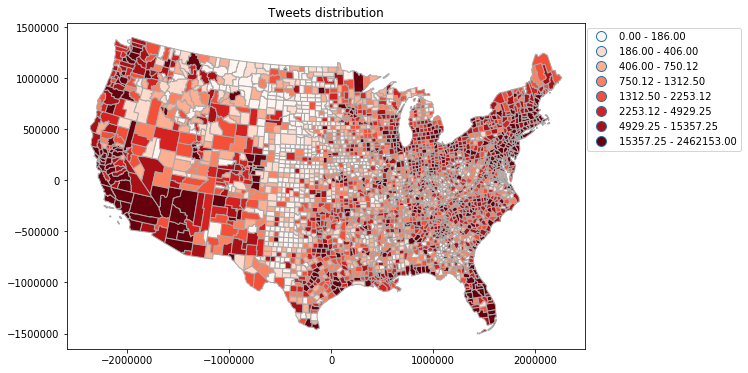

In [99]:
#Data
import pysal
shp = gp.read_file('/Users/Yuxiao/cb_2016_us_county_20m/cb_2016_us_county_20m.shp')
shp2 = shp.to_crs("+proj=lcc +lat_1=33 +lat_2=45 +lat_0=39 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs")
vmin, vmax = np.min(shp2['Tweet']), np.max(shp2['Tweet']) 
print(vmin,vmax)
ax = shp2.plot('Tweet',  figsize=(10,6),scheme='Quantiles', k=8, cmap='Reds', edgecolor = 'darkgrey', legend=True)
ax.set_title('Tweets' + ' distribution')
fig = ax.get_figure()

leg = ax.get_legend()
leg.set_bbox_to_anchor((1.11, 0.8, 0.2, 0.2))

In [87]:
help(leg.set_bbox_to_anchor)

Help on method set_bbox_to_anchor in module matplotlib.legend:

set_bbox_to_anchor(bbox, transform=None) method of matplotlib.legend.Legend instance
    set the bbox that the legend will be anchored.
    
    *bbox* can be a BboxBase instance, a tuple of [left, bottom,
    width, height] in the given transform (normalized axes
    coordinate if None), or a tuple of [left, bottom] where the
    width and height will be assumed to be zero.



0.0 1.95740032769


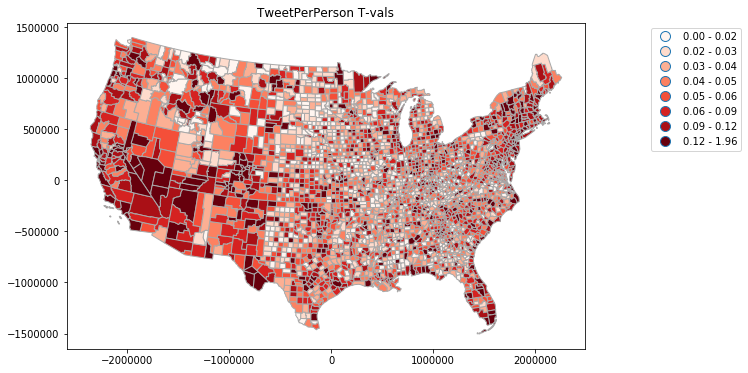

In [149]:
shp2["pop16"]=gp.GeoDataFrame(np.array(data.by_col('POP16')).reshape((-1,1)))
shp2["TweetPerPerson"]= shp2['Tweet']/shp2["pop16"]
vmin, vmax = np.min(shp2["TweetPerPerson"]), np.max(shp2["TweetPerPerson"]) 
print(vmin,vmax)
ax = shp2.plot("TweetPerPerson", scheme='quantiles', k=8, figsize=(10,6), cmap='Reds', edgecolor = 'darkgrey', legend=True)
ax.set_title('TweetPerPerson' + ' T-vals')
fig = ax.get_figure()

leg = ax.get_legend()
leg.set_bbox_to_anchor((1.11, 0.8, 0.2, 0.2))

In [152]:
shp2.loc[shp2['1']<-1.9]

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,Tweet,geometry,0,1,2,3,4,5,6,pop16,TweetPerPerson
0,39,131,01074078,0500000US39131,39131,Pike,06,1140324458,9567612,660,"POLYGON ((1082997.877588676 97295.00851193268,...",2.048987,-2.184443,1.458362,2.251668,1.803286,-0.376315,-1.913515,28160,0.023438
33,19,099,00465238,0500000US19099,19099,Jasper,06,1891773617,6565650,1283,"POLYGON ((219222.4578397536 319511.5287785939,...",0.465903,-2.179592,-0.141358,1.239992,1.355624,-0.036440,-1.962698,36708,0.034952
50,19,107,00465242,0500000US19107,19107,Keokuk,06,1500067253,1929323,136,"POLYGON ((298096.2355995318 283103.3770677047,...",0.081495,-2.483212,1.041662,0.180092,0.775715,-0.658758,-2.502673,10119,0.013440
74,51,051,01497376,0500000US51051,51051,Dickenson,06,856108125,8073687,225,POLYGON ((1183505.400943432 -110862.9938022067...,4.045605,-1.944938,0.940152,1.589422,-0.006699,0.663914,-4.101955,14968,0.015032
100,39,027,01074026,0500000US39027,39027,Clinton,06,1058487159,9351754,2998,"POLYGON ((1026554.71458377 96001.41460165603, ...",1.490940,-2.164939,1.064821,2.211611,2.171884,0.281698,-1.677717,41902,0.071548
110,19,057,00465217,0500000US19057,19057,Des Moines,06,1077714767,35334208,3534,"POLYGON ((388347.193972826 210082.2554477224, ...",-0.414464,-2.233785,1.970590,-0.673766,0.054813,-0.640103,-2.777416,39739,0.088930
119,19,127,00465252,0500000US19127,19127,Marshall,06,1482776070,1803080,3011,"POLYGON ((227660.675422071 358029.1887379016, ...",0.343549,-2.011302,-0.107468,1.238748,1.272026,-0.200548,-1.626346,40312,0.074692
127,19,123,00465250,0500000US19123,19123,Mahaska,06,1478527855,6564804,1054,"POLYGON ((259946.6054479606 281579.3902005331,...",0.399870,-2.311411,0.447131,0.686630,1.088932,-0.289671,-2.426627,22181,0.047518
152,21,189,00516941,0500000US21189,21189,Owsley,06,511282948,2285945,22,POLYGON ((1062391.854337459 -92741.08446538648...,4.234101,-2.446960,-1.362180,1.902032,0.939776,-0.446779,-3.870352,4491,0.004899
156,21,017,00516855,0500000US21017,21017,Bourbon,06,750370999,4849018,1312,POLYGON ((1003060.385022013 -15264.86484710625...,2.713089,-2.714317,1.114093,1.127988,1.834744,-0.085004,-2.039832,20030,0.065502


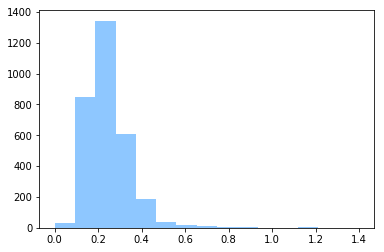

In [68]:
n, bins, patches = plt.hist(sqrt(shp2["TweetPerPerson"]), 15, facecolor='dodgerblue', alpha=0.5)

In [22]:
#Coordinates for calibration points
u = [row.geometry.centroid.x for index, row in shp2.iterrows()]
v = [row.geometry.centroid.y for index, row in shp2.iterrows()]
coords = list(zip(u,v))

In [23]:
#Find optimal bandwidth using golden section search to minimize AICc

#Instantiate bandwidth selection class - bisquare NN (adaptive)
bw = Sel_BW(coords, y, X, kernel='bisquare', fixed=False)

#Find optimal bandwidth by minimizing AICc using golden section search algorithm
bw = bw.search(search='golden_section', criterion='AICc')
print(bw)

134.0


In [103]:
#Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = GWR(coords, y, X, bw, fixed=False, kernel='bisquare')
results = model.fit()

In [25]:
shape(results.params)

(3108, 7)

In [36]:
paramsdf = pd.DataFrame(results.params, columns = ['Intercept','Poverty','Bachelor degree','age:15-24','age:25-34','age:35-44','White Male'])

In [38]:
paramsdf.head()

,Intercept,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
0,0.144441,-0.075240,0.204594,0.159990,0.220154,-0.027382,-0.322823
1,-0.426167,0.074476,0.199129,0.014705,0.015046,-0.020732,0.016953
2,-0.176634,0.029146,0.189601,-0.062286,0.247011,-0.159564,-0.004904
3,0.172116,0.321683,0.581321,-0.125348,0.015323,-0.004538,-0.111497
4,-0.017423,-0.115074,0.227818,0.032537,0.089029,-0.039662,-0.208842


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000000017D246D8>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x0000000016B79588>]], dtype=object)

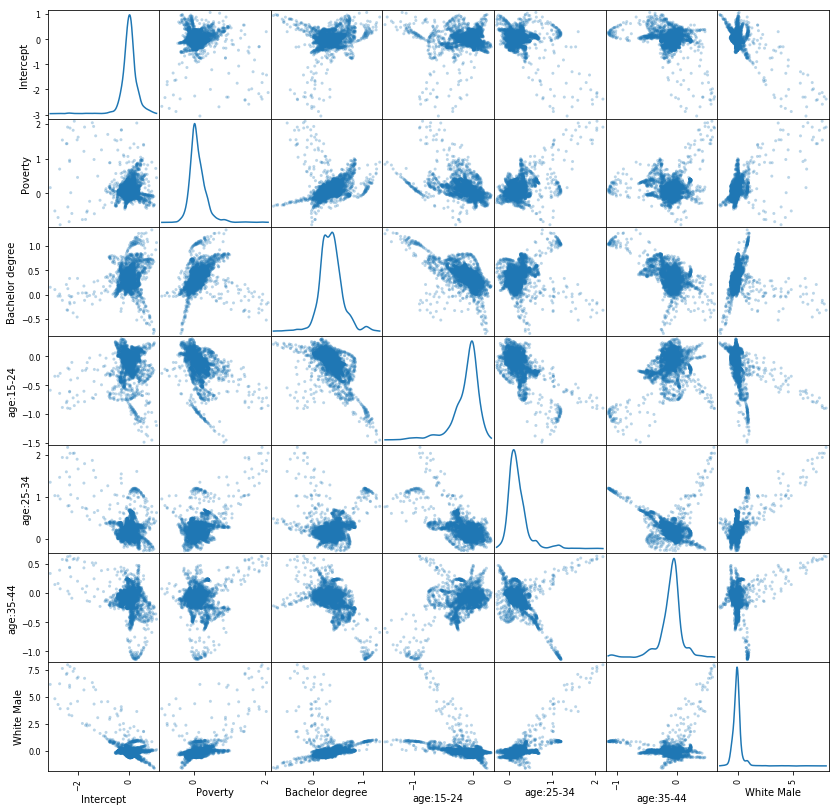

In [39]:
pd.plotting.scatter_matrix(paramsdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

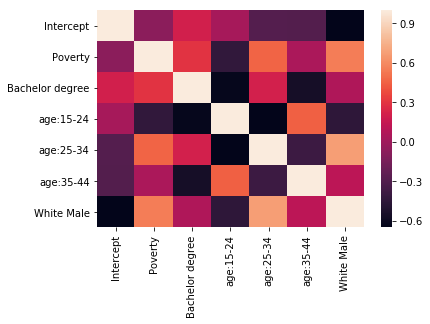

In [40]:
import seaborn as sns
corr = paramsdf.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

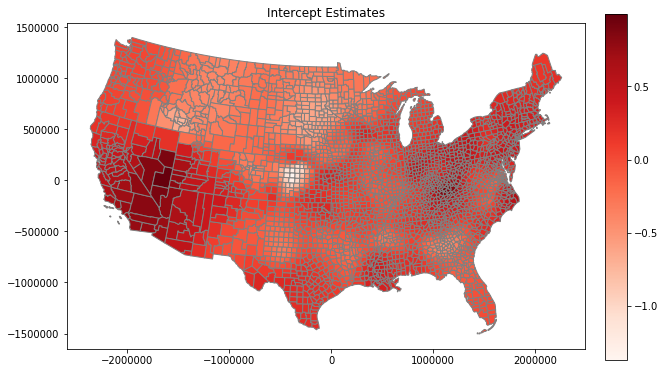

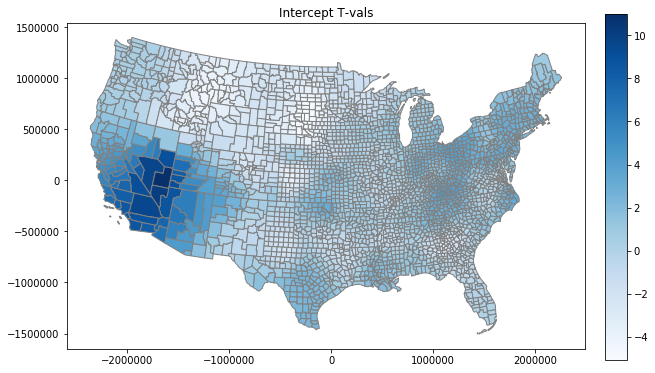

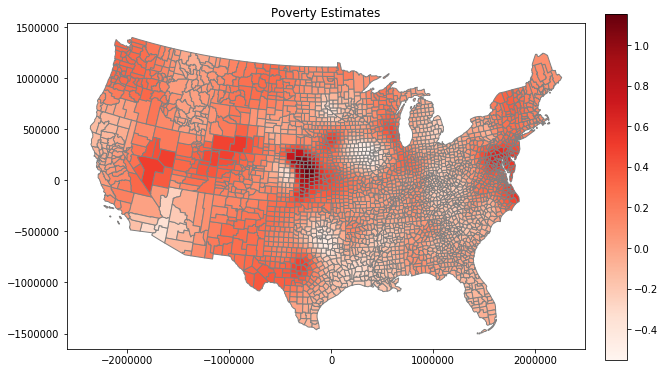

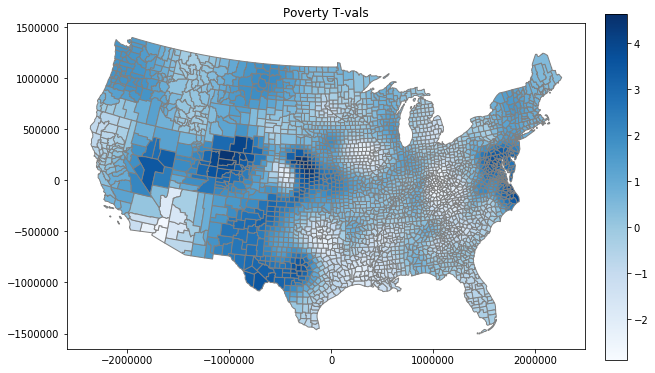

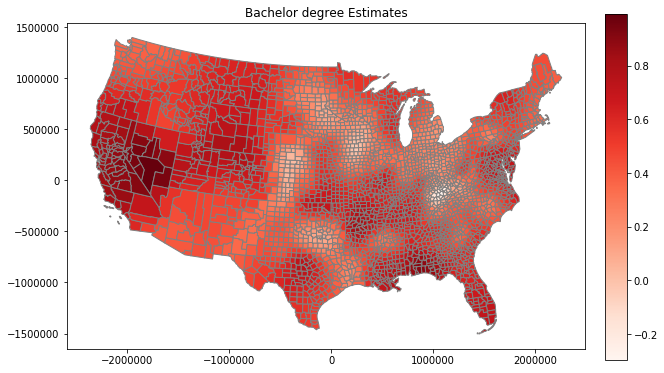

...

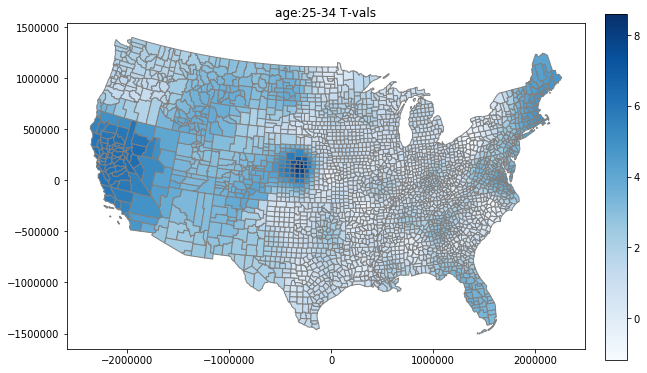

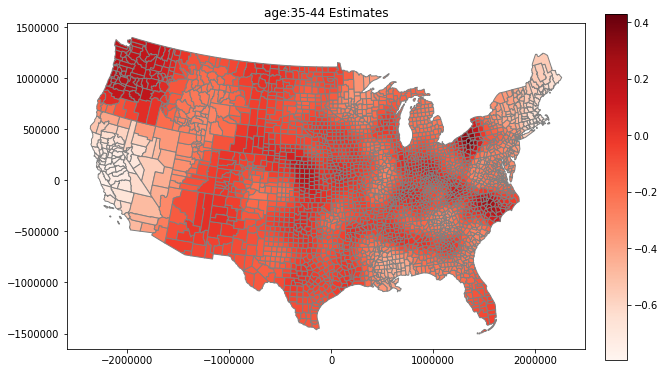

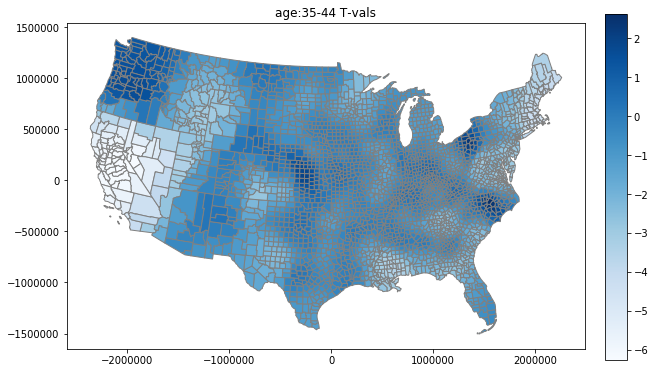

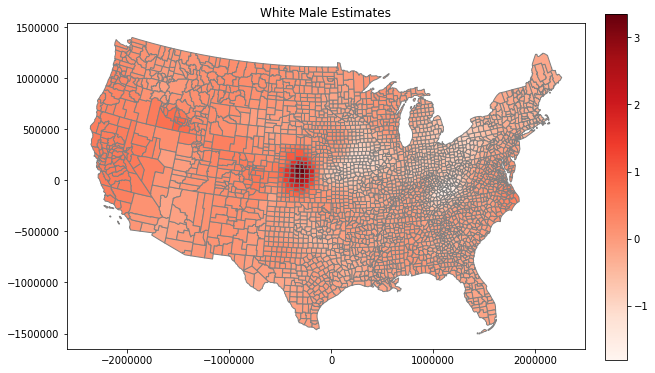

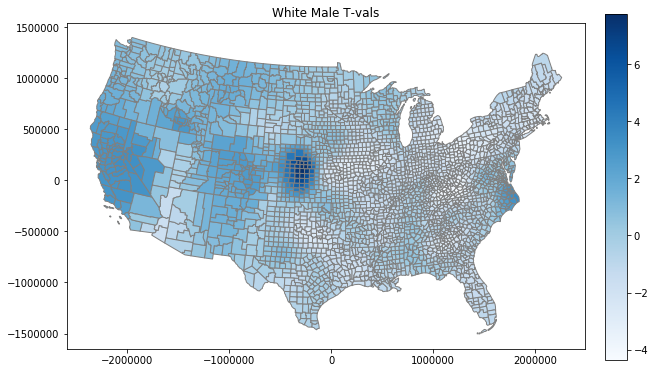

In [129]:
for param in range(results.params.shape[1]):
    shp2[str(param)] = results.params[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Reds', edgecolor = 'grey')
    ax.set_title(labels[param] + ' Estimates')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    
    shp2[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Blues', edgecolor = 'grey')
    ax.set_title(labels[param] + ' T-vals')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Blues')
    sm._A = []
    fig.colorbar(sm, cax=cax)

In [33]:
results.llf

-3462.4679098602865

In [34]:
aic = -2.0 * results.llf + 2.0 * (results.tr_S+1)
aic

7704.2649203125548

In [35]:
aicc = -2.0*results.llf + 2.0*results.n*(results.tr_S + 1.0)/(results.n-results.tr_S-2.0)
aicc

7816.3071242474834

# transform the dependent variable

In [47]:
y = np.array(data.by_col('Tweets')).reshape((-1,1))
y = y/POP16
y = sqrt(y)
y = (y - np.mean(y)) / np.std(y)
y

array([[-0.88966609],
       [-0.93718268],
       [ 0.32785024],
       ..., 
       [ 0.81092003],
       [ 0.16456553],
       [-0.16104053]])

In [48]:
#Find optimal bandwidth using golden section search to minimize AICc

#Instantiate bandwidth selection class - bisquare NN (adaptive)
bw = Sel_BW(coords, y, X, kernel='bisquare', fixed=False)

#Find optimal bandwidth by minimizing AICc using golden section search algorithm
bw = bw.search(search='golden_section', criterion='AICc')
print(bw)

159.0


In [49]:
#Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = GWR(coords, y, X, bw, family=Gaussian(), fixed=False, kernel='bisquare')
results = model.fit()

In [50]:
shape(results.params)

(3108, 7)

In [51]:
paramsdf = pd.DataFrame(results.params, columns = ['Intercept','Poverty','Bachelor degree','age:15-24','age:25-34','age:35-44','White Male'])

In [52]:
paramsdf.head()

,Intercept,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
0,0.327769,-0.208331,0.228870,0.258999,0.285366,-0.050290,-0.597483
1,-0.629410,0.082052,0.328421,0.054096,0.054827,-0.036523,0.006217
2,-0.180182,0.007939,0.305989,-0.065976,0.360010,-0.246983,-0.048358
3,0.232750,0.269091,0.665750,-0.073868,0.036686,-0.004008,-0.113447
4,0.069208,-0.105565,0.313248,0.081990,0.094049,0.020579,-0.291681


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000001557D048>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x0000000013D35F28>]], dtype=object)

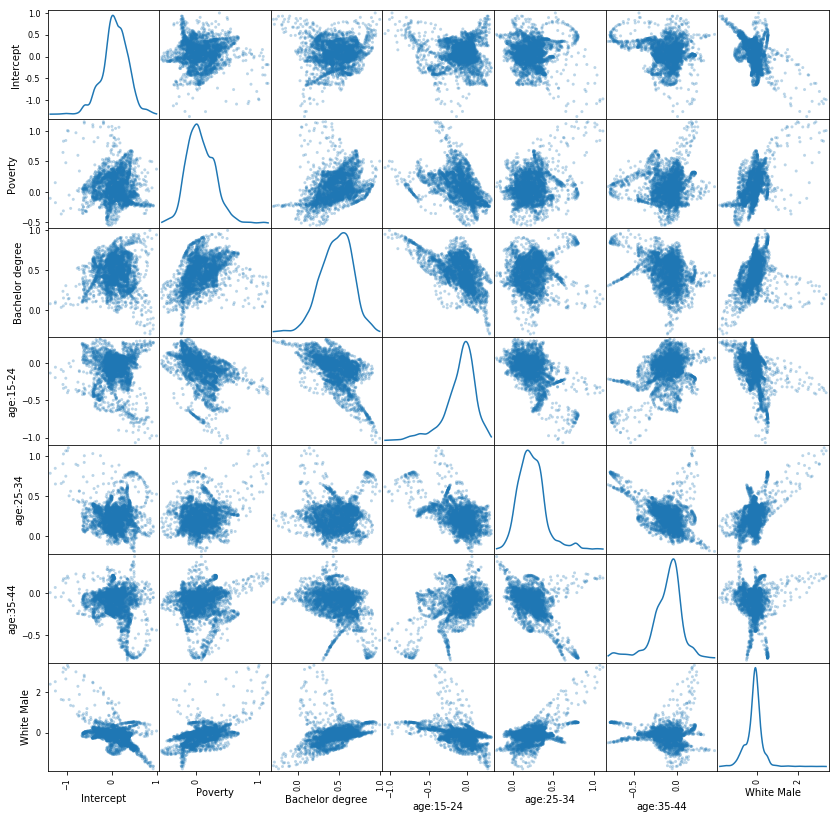

In [53]:
pd.plotting.scatter_matrix(paramsdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

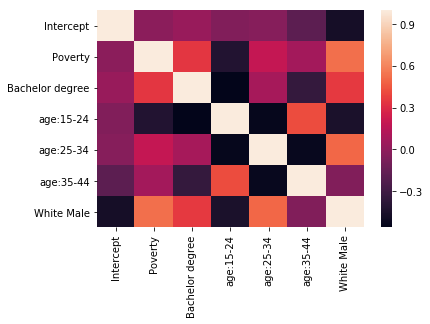

In [54]:
import seaborn as sns
corr = paramsdf.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [ ]:
#Data
import pysal
shp = gp.read_file('/Users/Yuxiao/cb_2016_us_county_20m/cb_2016_us_county_20m.shp')
shp2 = shp.to_crs("+proj=lcc +lat_1=33 +lat_2=45 +lat_0=39 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs")
vmin, vmax = np.min(shp2['Tweet']), np.max(shp2['Tweet']) 
print(vmin,vmax)
ax = shp2.plot('Tweet',  figsize=(10,6),scheme='Quantiles', k=8, cmap='Reds', edgecolor = 'darkgrey', legend=True)
ax.set_title('Tweets' + ' distribution')
fig = ax.get_figure()

leg = ax.get_legend()
leg.set_bbox_to_anchor((1.11, 0.8, 0.2, 0.2))

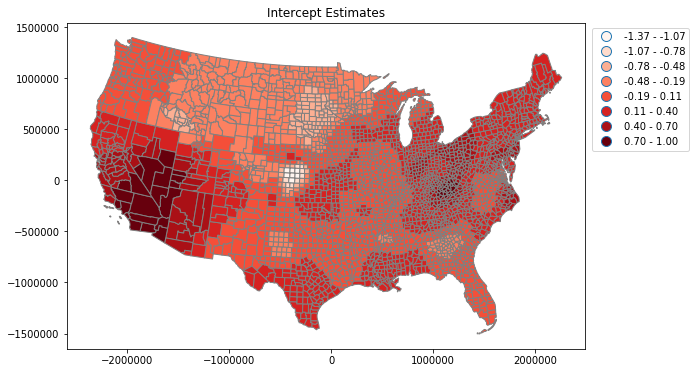

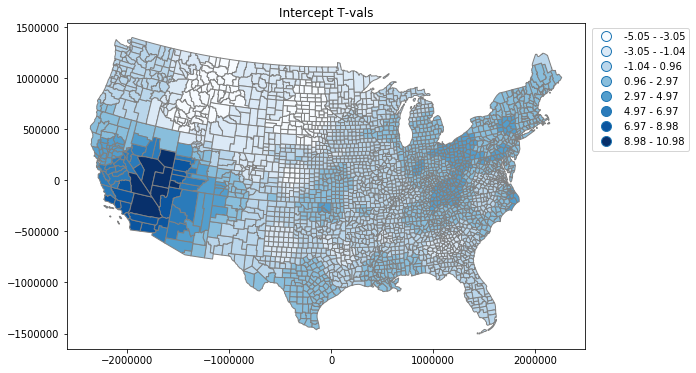

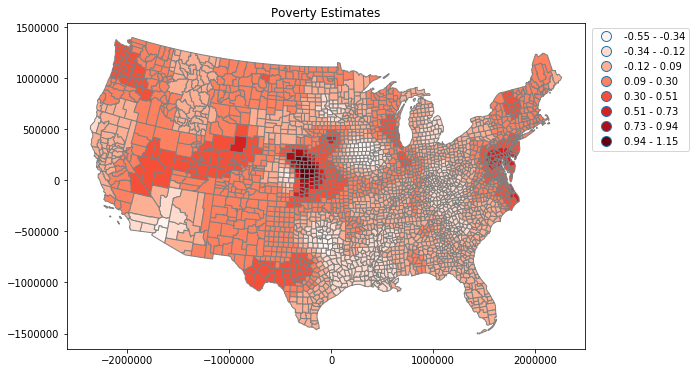

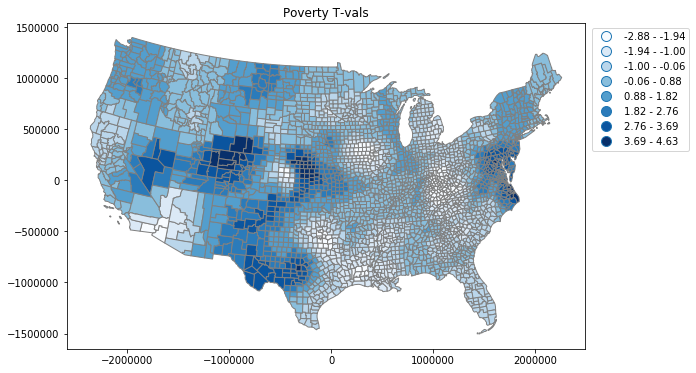

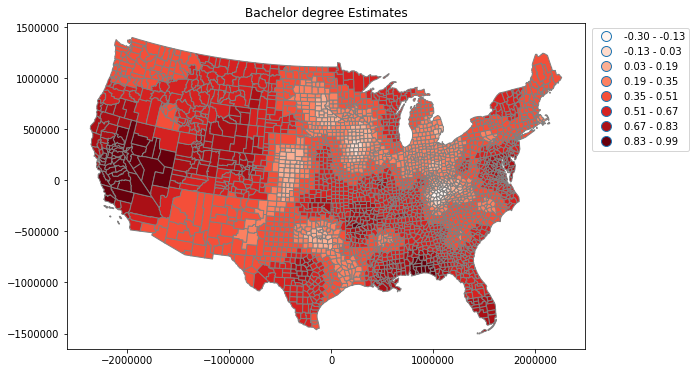

...

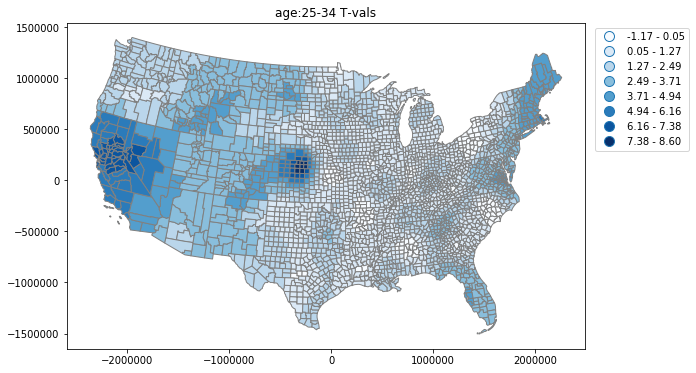

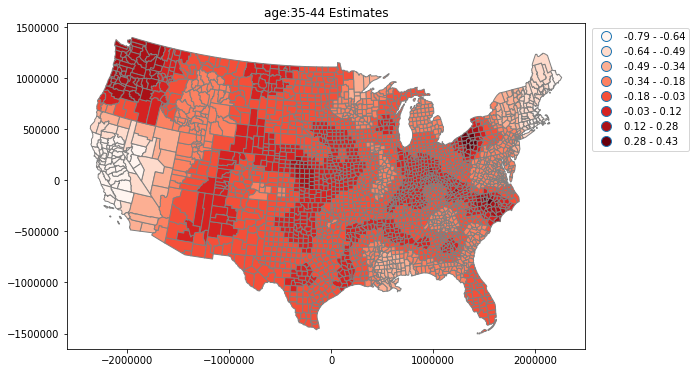

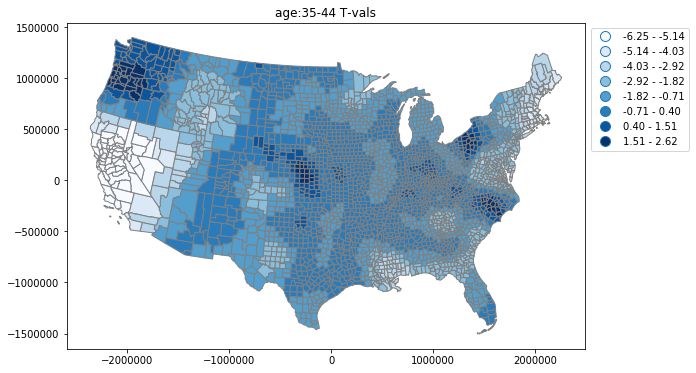

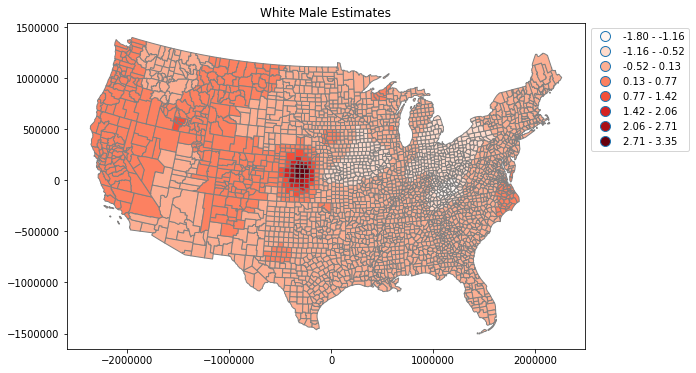

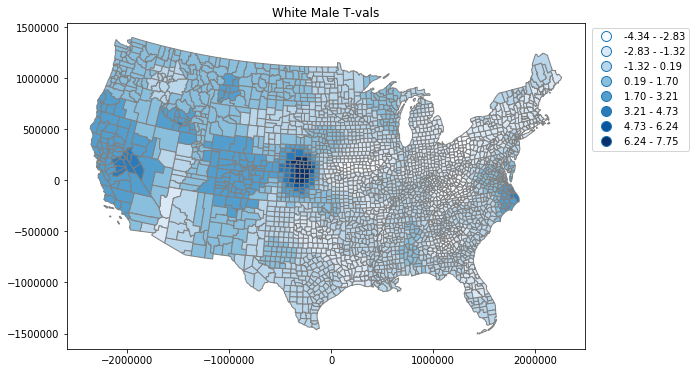

In [135]:
import pysal
for param in range(results.params.shape[1]):
    shp2[str(param)] = results.params[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param),  figsize=(10,6),scheme='equal_interval', k=8,cmap='Reds', edgecolor = 'grey',legend=True)
    ax.set_title(labels[param] + ' Estimates')
    fig = ax.get_figure()
    leg = ax.get_legend()
    leg.set_bbox_to_anchor((1.01, 0.8, 0.2, 0.2))

    
    shp2[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param),figsize=(10,6),scheme='equal_interval',  k=8, cmap='Blues', edgecolor = 'grey',legend=True)
    ax.set_title(labels[param] + ' T-vals')
    fig = ax.get_figure()
    leg = ax.get_legend()
    leg.set_bbox_to_anchor((1.01, 0.8, 0.2, 0.2))

    

In [56]:
results.llf

-3230.470907316525

In [57]:
aic = -2.0 * results.llf + 2.0 * (results.tr_S+1)
aic

7124.3124867362885

In [58]:
aicc = -2.0*results.llf + 2.0*results.n*(results.tr_S + 1.0)/(results.n-results.tr_S-2.0)
aicc

7203.8327291946625

In [110]:
paramsdf.describe()

,Intercept,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
count,3108.000000,3108.000000,3108.000000,3108.000000,3108.000000,3108.000000,3108.000000
mean,0.073559,0.079064,0.468429,-0.088412,0.233215,-0.116250,-0.126887
std,0.284786,0.230865,0.186231,0.203244,0.164825,0.169510,0.437192
min,-1.368802,-0.550501,-0.295265,-1.067870,-0.195867,-0.794408,-1.804775
25%,-0.079357,-0.082568,0.342815,-0.178120,0.123883,-0.196698,-0.298739
50%,0.077613,0.050327,0.479912,-0.048447,0.217450,-0.086278,-0.102894
75%,0.258449,0.229052,0.604600,0.042056,0.322121,-0.012612,0.041265
max,0.995467,1.154223,0.992129,0.319310,1.107660,0.429665,3.349323


In [114]:
results.resid_ss

1454.864070269839

In [113]:
help(results)

Help on GWRResults in module gwr.gwr object:

class GWRResults(spglm.glm.GLMResults)
 |  Basic class including common properties for all GWR regression models
 |  
 |  Parameters
 |  ----------
 |      model               : GWR object
 |                          pointer to GWR object with estimation parameters
 |  
 |      params              : array
 |                            n*k, estimated coefficients
 |  
 |      predy               : array
 |                            n*1, predicted y values
 |  
 |      w                   : array
 |                            n*1, final weight used for iteratively re-weighted least
 |                            sqaures; default is None
 |  
 |      S                   : array
 |                            n*n, hat matrix
 |  
 |      CCT                 : array
 |                            n*k, scaled variance-covariance matrix
 |  
 |  Attributes
 |  ----------
 |      model               : GWR Object
 |                            points t